# Basic Geospatial Visualisation: The Netherlands

This is an elementary geospatial visualisation exercise on Python. I use the polygon shapefile containing the first-level administrative divisions (provinces) of Netherlands. 

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import plotly.express as px
import matplotlib.pyplot as plt
import json
import colorcet as cc
import seaborn as sns

In [3]:
# Reading the shapefile and the CBS data. The data contains province-wise natural gas consumption in the year 2015.

df = gpd.read_file("https://stacks.stanford.edu/file/druid:st293bj4601/data.zip")
energy = pd.read_csv("C:\\Users\\anime\\Downloads\\energy.csv", sep = ';')

In [4]:
# Cleaning data for convenience

energy = energy[energy['Housing characteristics'] == 'Total dwellings']
province_mapping = {
    'Groningen (PV)': 'Groningen',
    'Fryslân (PV)': 'Friesland',
    'Drenthe (PV)': 'Drenthe',
    'Overijssel (PV)' : 'Overijssel',
    'Flevoland (PV)' : 'Flevoland',
    'Gelderland (PV)' : 'Gelderland',
    'Utrecht (PV)' : 'Utrecht',
    'Noord-Holland (PV)' : 'Noord-Holland',
    'Zuid-Holland (PV)' : 'Zuid-Holland',
    'Zeeland (PV)' : 'Zeeland',
    'Noord-Brabant (PV)' : 'Noord-Brabant',
    'Limburg (PV)' : 'Limburg'}

def replace_name(province):
    return province_mapping.get(province, province)    

energy.loc[:, 'Regions'] = energy['Regions'].apply(replace_name)
df.rename(columns={'NAME_1': 'Regions'}, inplace=True)
energy = energy[['Housing characteristics', 'Regions', 'Periods', 'Average consumption of natural gas (m3)', 'Average supply of electricity (kWh)']]
df = df[df['TYPE_1'] == 'Provincie']
df = df.reset_index(drop=True)
merged = df.merge(energy, on = ['Regions'])

In [5]:
ac = merged.explore('Average consumption of natural gas (m3)')
ac

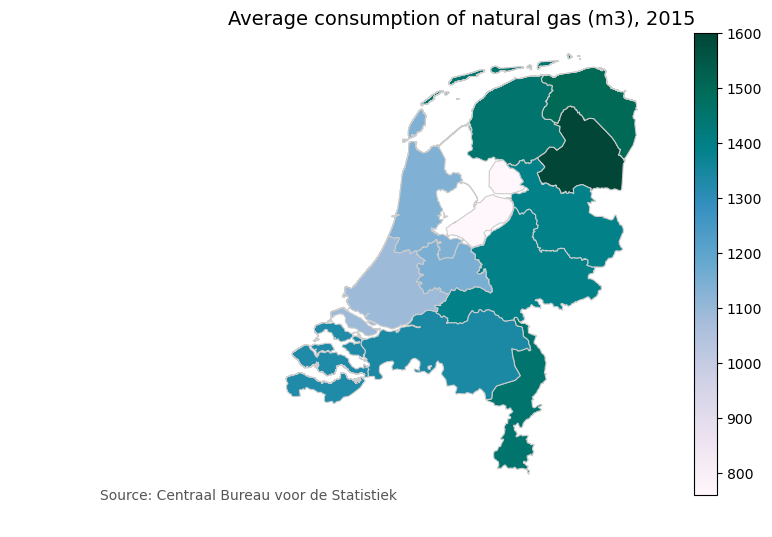

In [6]:
variable = 'Average consumption of natural gas (m3)'

vmin, vmax = 120, 220

fig, ax = plt.subplots(1, figsize=(10, 6))
merged.plot(column=variable, cmap='PuBuGn', linewidth=0.8, ax=ax, edgecolor= '0.8', legend=True)
ax.axis('off')
ax.set_title('Average consumption of natural gas (m3), 2015',fontdict={'fontsize': '14', 'fontweight' : '3'})
ax.annotate('Source: Centraal Bureau voor de Statistiek', xy=(0.1, .08),  xycoords= 'figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=10, color='#555555')
plt.savefig('avg_gas.png', bbox_inches='tight')

In [9]:
# Reading data for natural gas consumption from 2015 to 2022

energy_total = pd.read_csv("C:\\Users\\anime\\Downloads\\energy_total.csv", sep = ';')
energy_total.loc[:, 'Regions'] = energy_total['Regions'].apply(replace_name)
energy_total = energy_total[energy_total['Housing characteristics'] == 'Total dwellings']
energy_total['Periods'] = energy_total['Periods'].str.replace('2022*', '2022', regex=False)
merged1 = df.merge(energy_total, on = ['Regions'])

In [10]:
gdf_json = json.loads(merged1.to_json())
merged1['Periods'] = merged1['Periods'].astype(str)

In [ ]:
# Animated choropleth map tracking the changes in natural gas consumption

fig = px.choropleth_mapbox(
    merged1,
    geojson=gdf_json,
    locations='Regions',
    featureidkey='properties.Regions',
    color='Average consumption of natural gas (m3)',
    animation_frame='Periods',
    mapbox_style="carto-positron",
    zoom=6,
    center={"lat": 52.366, "lon": 5.515},
    color_continuous_scale="Emrld",
    title="Natural Gas Consumption in the Netherlands (2015-2022)",
    range_color=(merged1['Average consumption of natural gas (m3)'].min(), merged1['Average consumption of natural gas (m3)'].max()),
    width=1100,
    height=750
)

fig.show()

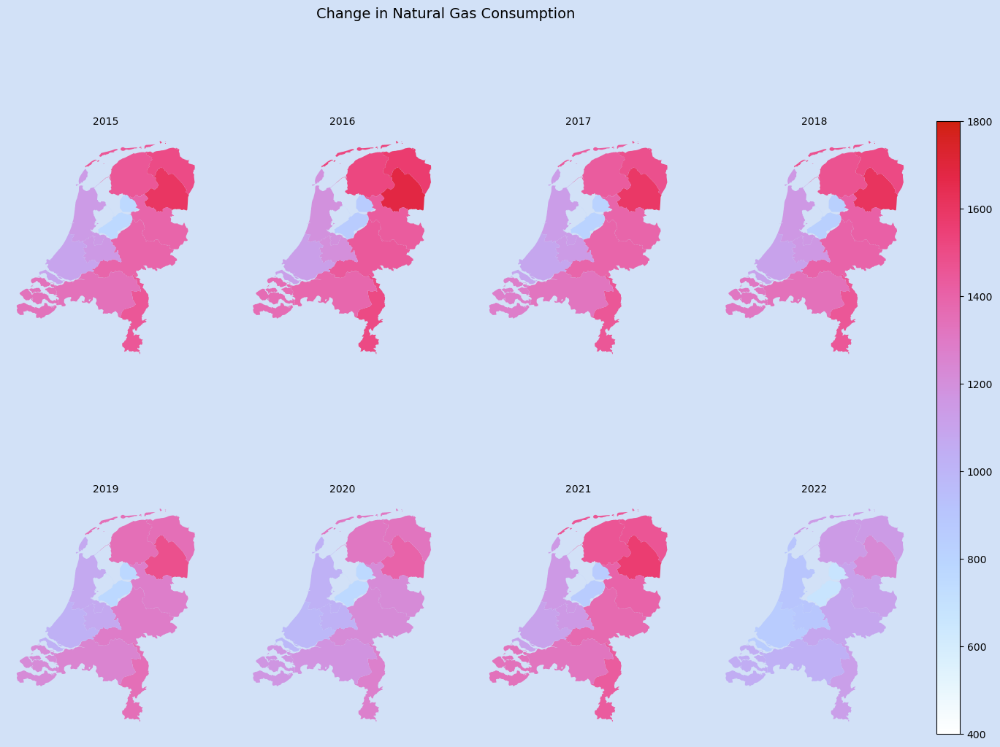

In [11]:
# Spatio-temporal plot

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 12))
axes = axes.flatten()
fig.patch.set_facecolor('#d2e1f7')
legend_choice = [False] * len(axes)
legend_choice[2] = True
for i, year in enumerate(merged1["Periods"].unique()):
    merged1_cut = merged1[merged1["Periods"] == year]
    merged1_cut.plot(
        ax=axes[i],
        column=variable,
        vmin=400,
        vmax=1800,
        cmap=cc.cm.CET_L19,
    )
    axes[i].axis("off")
    axes[i].set_title(pd.to_datetime(str(year)).strftime("%Y"), size=10)

cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  
sm = plt.cm.ScalarMappable(cmap=cc.cm.CET_L19, norm=plt.Normalize(vmin=400, vmax=1800))
cbar = fig.colorbar(sm, cax=cbar_ax) 

plt.suptitle("Change in Natural Gas Consumption", size=14)
plt.savefig('gas_change.png', bbox_inches='tight')
plt.show()

We can observe that the natural gas consumption across provinces is on a steady decline. There is a surge in the consumption in 2021 presumably due to the resumption of full scale economic activity after the end of the lockdown.

In [13]:
# Reading data for fixed capital formation

fcf = pd.read_csv("C:\\Users\\anime\\Downloads\\fcf.csv", sep = ';')
fcf.loc[:, 'Regions'] = fcf['Regions'].apply(replace_name)
merged2 = df.merge(fcf, on = ['Regions'])

In [14]:
fc = merged2.explore('Fixed capital formation (million euros)')
fc

In [15]:
gdf1_json = json.loads(merged2.to_json())
merged2['Periods'] = merged2['Periods'].astype(str)

In [ ]:
fig = px.choropleth_mapbox(
    merged2,
    geojson=gdf1_json,
    locations='Regions',
    featureidkey='properties.Regions',
    color='Fixed capital formation (million euros)',
    animation_frame='Periods',
    mapbox_style="carto-positron",
    zoom=6,
    center={"lat": 52.366, "lon": 5.515},
    color_continuous_scale="tempo",
    title="Fixed capital formation (million euros) (2015-2021)",
    range_color=(merged2['Fixed capital formation (million euros)'].min(), merged2['Fixed capital formation (million euros)'].max()),
    width=1100,
    height=750
)

fig.show()

The fixed capital formation appears to be increasing unevenly. Let's see if there is any correlation between fixed capital formation and natural gas consumption.

In [16]:
energy_total = energy_total[energy_total['Periods'] != '2022']
fcf['Periods'] = fcf['Periods'].astype(str)
energyfcf = energy_total.merge(fcf, on = ['Regions', 'Periods'])

In [ ]:
sns.lmplot(
    data=energyfcf,
    x='Fixed capital formation (million euros)',
    y='Average consumption of natural gas (m3)',
    col='Regions',
    hue='Periods',
    col_wrap=4,
    height=4,
    aspect=1,
    palette='viridis',
    scatter_kws={"s": 100, "alpha": 0.7}, 
    line_kws={"color": "red", "lw": 2},  
)

plt.suptitle('Correlation between Natural Gas Consumption and Fixed Capital Formation (2015-2021)', size=16)
plt.subplots_adjust(top=0.9)  
plt.savefig('corr.png', bbox_inches='tight')
plt.show()

There does not appear to be any coherent relationship between fixed capital formation and natural gas consumption.